##### Yona MELLUL - 3800646

# PRAT : Classification of colposcopy images

In [1]:
from data_prep import *
from model import ModifiedResNet152
from eval import *
from training import *
from utils import *

%load_ext autoreload
%autoreload 2

ModuleNotFoundError: No module named 'utils'

## DATA

In [8]:
done = True 
if not done:
    batch_size = 32
    CUDA = torch.cuda.is_available()
    prepare_data(batch_size, CUDA)

if done : 
    train, val, test = load_loaders('sans_aug', path = 'loaders/')
    train2, val2, test2 = load_loaders('avec_aug', path = 'loaders/')

ModuleNotFoundError: No module named 'data_prep'

DATA SANS AUGMENTATION : LOW-RISK VS. HIGH-RISK
- class 0 : 420 images, 138 patients
- class 1 : 60 images, 44 patients

DATA AVEC AUGMENTATION : LOW-RISK VS. HIGH-RISK
- class 0 : 420 images, 138 patients
- class 1 : 410 images, 44 patients


## MODEL

In [33]:
CUDA = False
device = torch.device("cuda" if CUDA else "cpu")
model = ModifiedResNet152(num_classes=2, unfreeze_layers=3).to(device)
#model

## TRAINING

The training is obviously already done, so if you execute these cells, you'll get some metrics and curves representing the three models

### Training of Model A (no augmentation, cross-entropy loss)

Patient-level Metrics:
Accuracy: 89.29%
AUC: 1.00
AP: 1.00
Sensitivity: 66.67%
Specificity: 92.00%
PPV: 50.00%
NPV: 95.83%


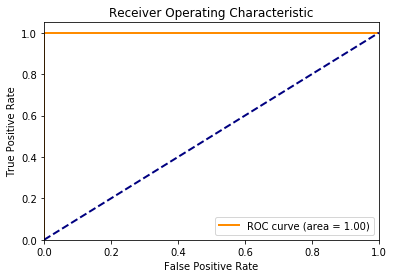

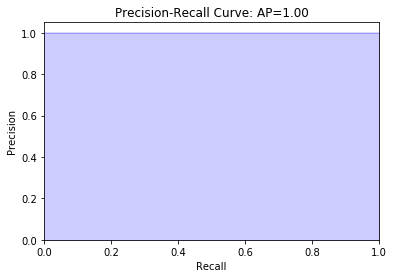

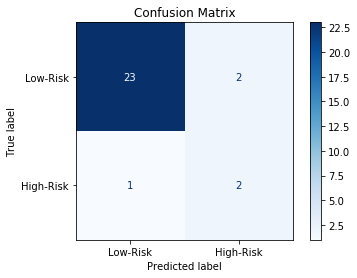

In [34]:
device = torch.device("cuda" if CUDA else "cpu")
done = True
if not done:
  batch_size = 32
  modelA = main('modelA', batch_size=batch_size, unfreeze=3, num_epochs=100, lr=0.0001, augment = False, loss='CE')
acc_A, auc_A, sensitivity_A, specificity_A, ppv_A, npv_A = evaluate_model('modelA', device, augment = False,  voting='high')

### Training of Model B (augmentation, cross-entropy loss)

Patient-level Metrics:
Accuracy: 75.00%
AUC: 0.89
AP: 0.66
Sensitivity: 100.00%
Specificity: 72.00%
PPV: 30.00%
NPV: 100.00%


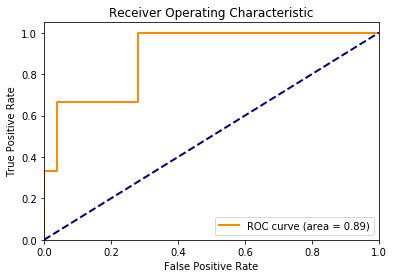

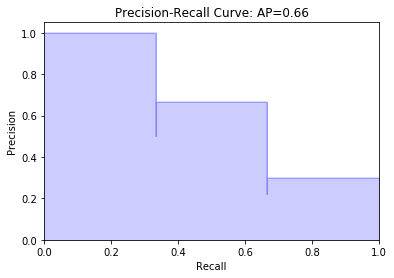

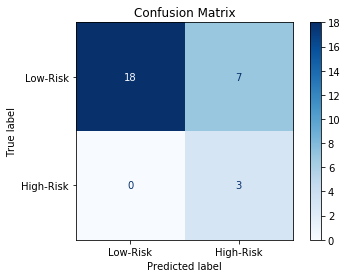

In [36]:
device = torch.device("cuda" if CUDA else "cpu")
done = True
if not done:
  batch_size = 32
  modelB = main('modelB', batch_size=batch_size, unfreeze=3, num_epochs=100, lr=0.0001, augment = True, loss='CE')
acc_B, auc_B, sensitivity_B, specificity_B, ppv_B, npv_B = evaluate_model('modelB', device, augment = True, voting='high')

### Training of Model C (no augmentation, focal loss)

Patient-level Metrics:
Accuracy: 96.43%
AUC: 0.75
AP: 0.71
Sensitivity: 66.67%
Specificity: 100.00%
PPV: 100.00%
NPV: 96.15%


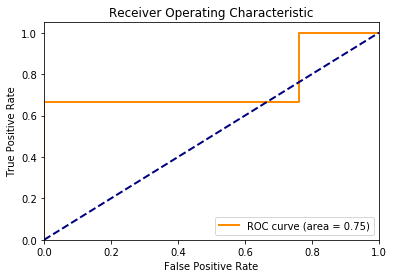

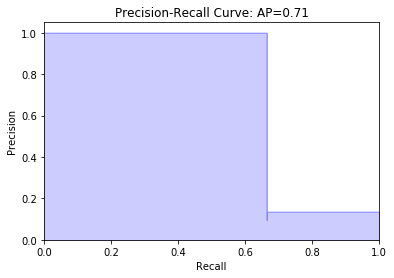

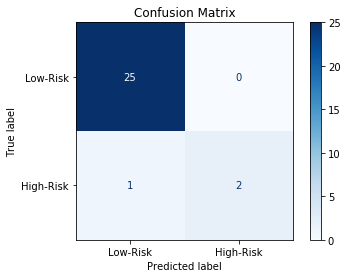

In [35]:
device = torch.device("cuda" if CUDA else "cpu")
done = True
if not done:
  batch_size = 32
  modelC = main('modelC', batch_size=batch_size, unfreeze=3, num_epochs=100, lr=0.0001, augment = False, loss='FL')
acc_C, auc_C, sensitivity_C, specificity_C, ppv_C, npv_C = evaluate_model('modelC', device, augment=False, voting='high')

## GRAD-CAM

In [39]:
train, val, test = load_loaders('sans_aug', path = 'loaders/')
train2, val2, test2 = load_loaders('avec_aug', path = 'loaders/')

Patient ID : 197 | Voted classification: low-risk | Ground Truth: low-risk


/opt/anaconda3/lib/python3.7/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


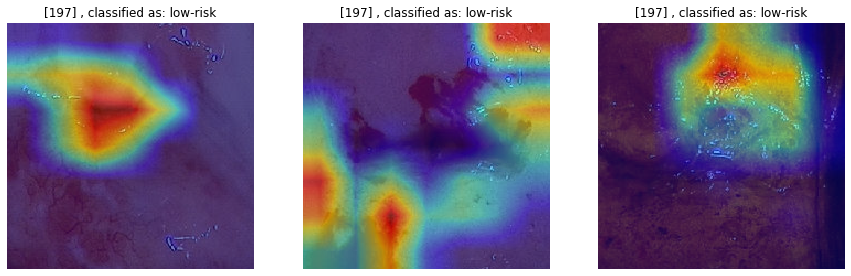

Patient ID : 216 | Voted classification: low-risk | Ground Truth: low-risk


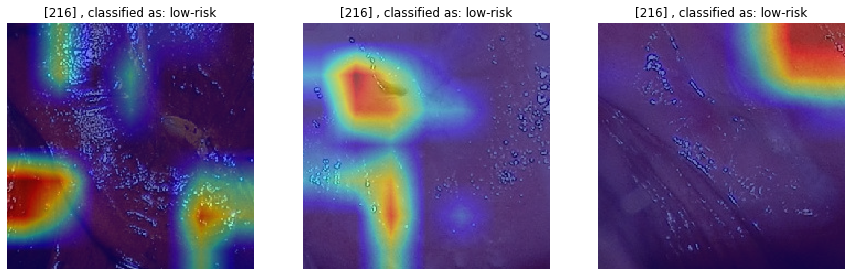

Patient ID : 239 | Voted classification: low-risk | Ground Truth: low-risk


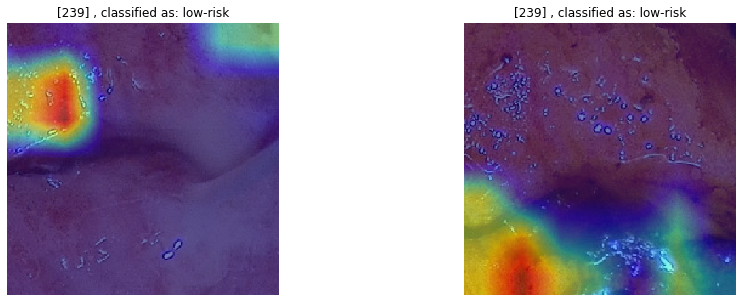

Patient ID : 223 | Voted classification: low-risk | Ground Truth: low-risk


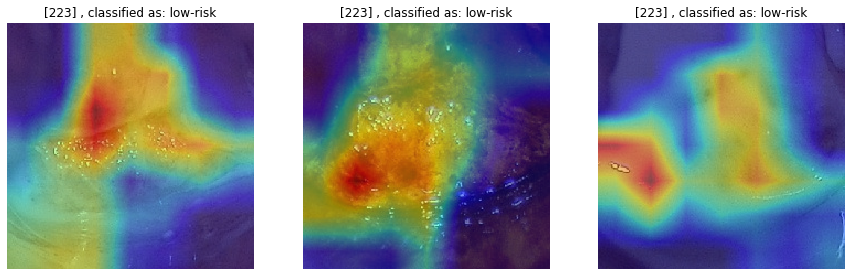

Patient ID : 171 | Voted classification: high-risk | Ground Truth: high-risk


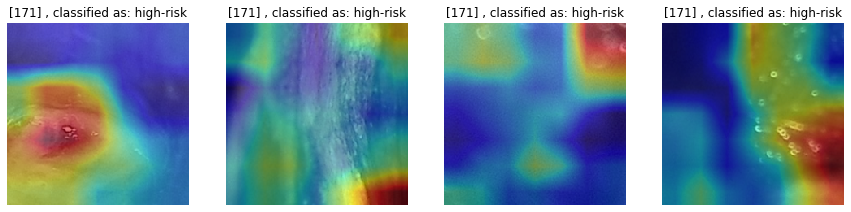

Patient ID : 146 | Voted classification: low-risk | Ground Truth: low-risk


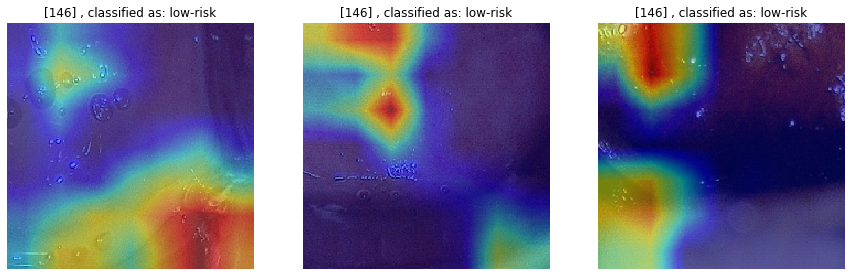

Patient ID : 212 | Voted classification: low-risk | Ground Truth: high-risk


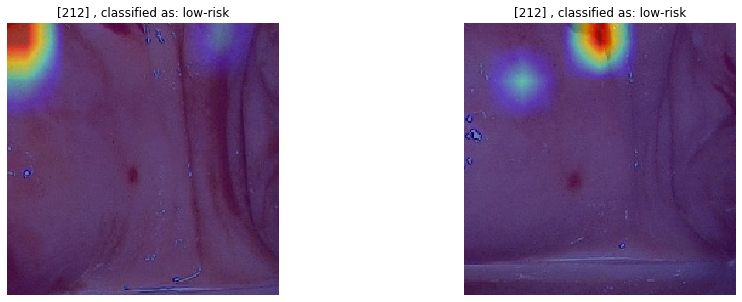

Patient ID : 16 | Voted classification: low-risk | Ground Truth: low-risk


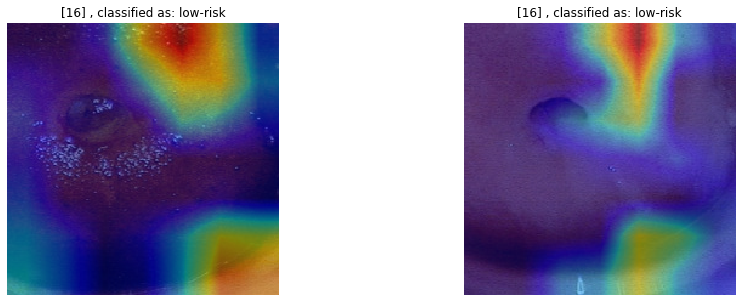

Patient ID : 96 | Voted classification: high-risk | Ground Truth: low-risk


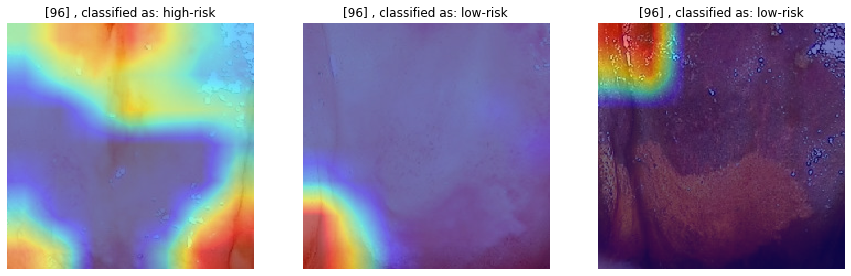

Patient ID : 134 | Voted classification: low-risk | Ground Truth: low-risk


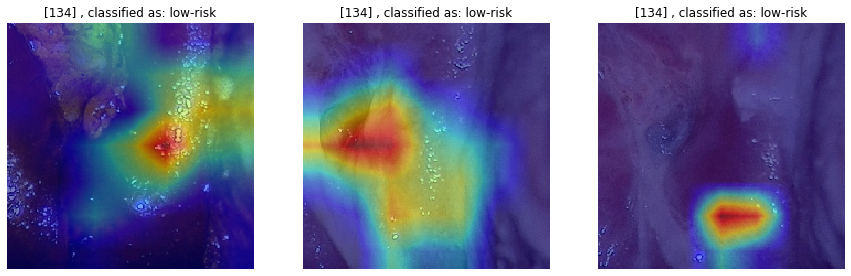

Patient ID : 126 | Voted classification: low-risk | Ground Truth: low-risk


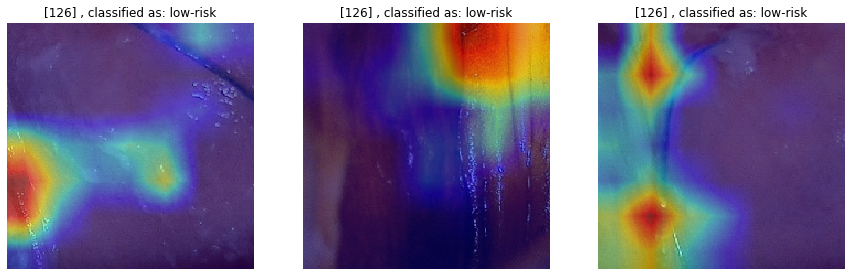

Patient ID : 237 | Voted classification: high-risk | Ground Truth: high-risk


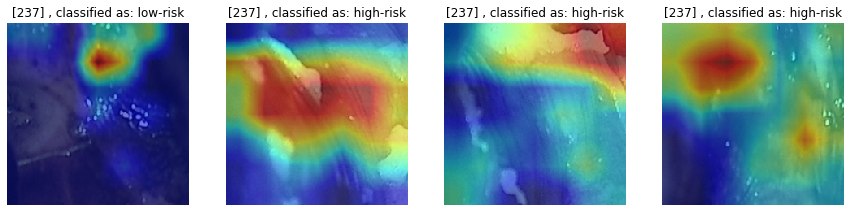

Patient ID : 122 | Voted classification: low-risk | Ground Truth: low-risk


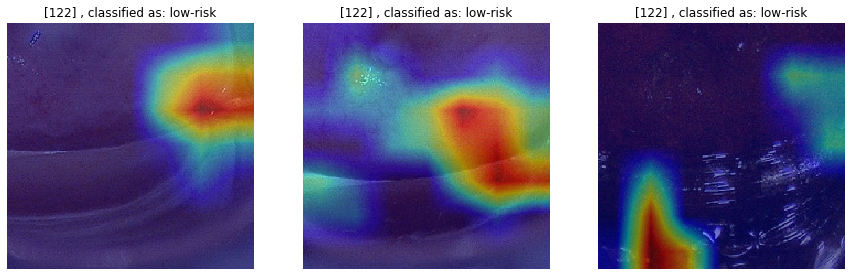

Patient ID : 8 | Voted classification: low-risk | Ground Truth: low-risk


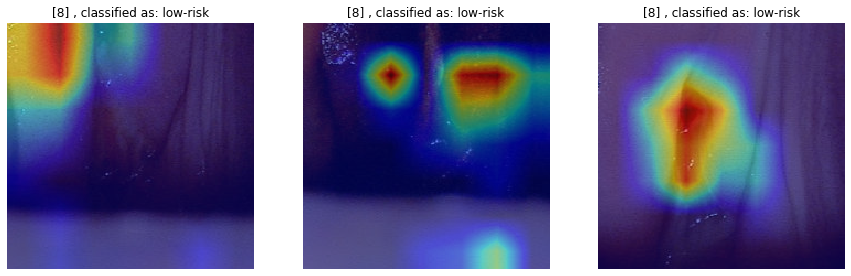

Patient ID : 68 | Voted classification: low-risk | Ground Truth: low-risk


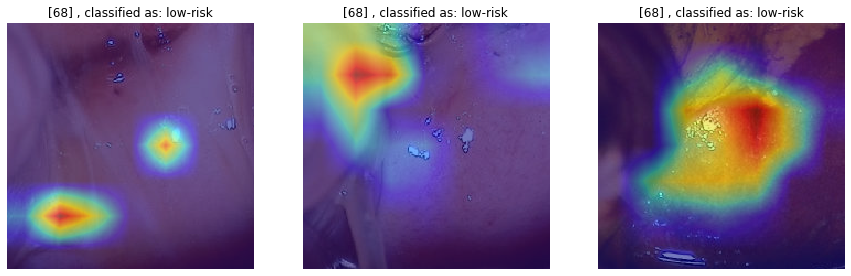

Patient ID : 22 | Voted classification: low-risk | Ground Truth: low-risk


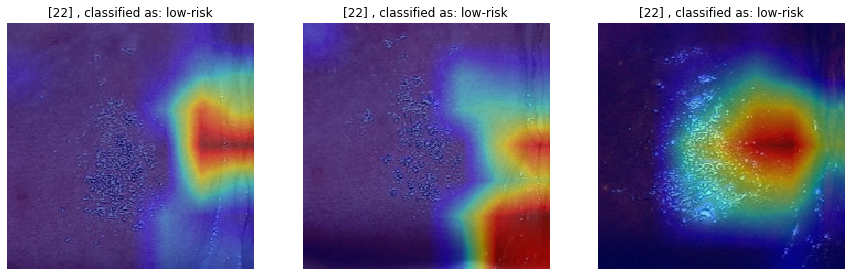

Patient ID : 17 | Voted classification: low-risk | Ground Truth: low-risk


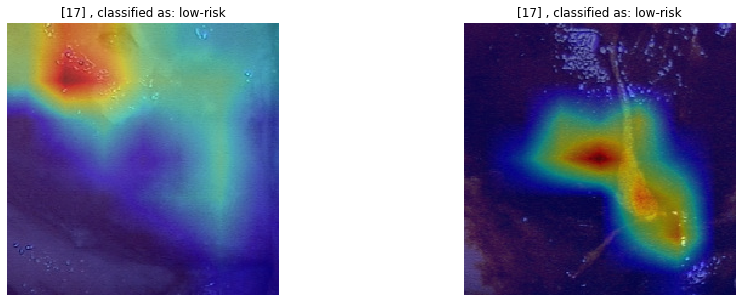

Patient ID : 10 | Voted classification: low-risk | Ground Truth: low-risk


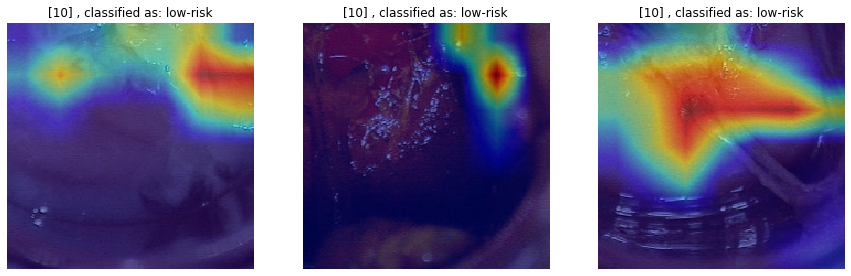

Patient ID : 117 | Voted classification: low-risk | Ground Truth: low-risk


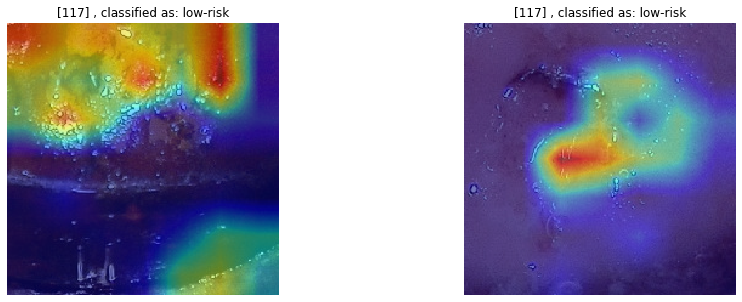

Patient ID : 192 | Voted classification: low-risk | Ground Truth: low-risk


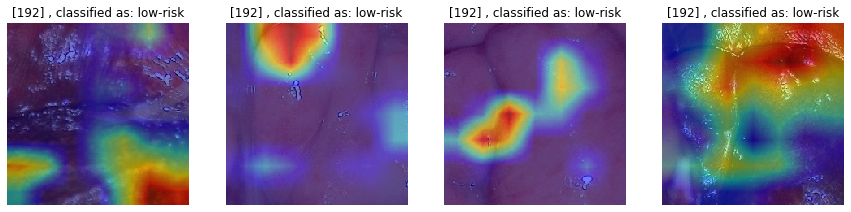

Patient ID : 183 | Voted classification: low-risk | Ground Truth: low-risk


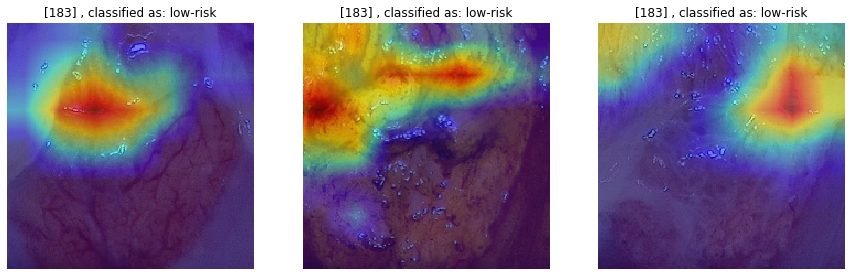

Patient ID : 143 | Voted classification: low-risk | Ground Truth: low-risk


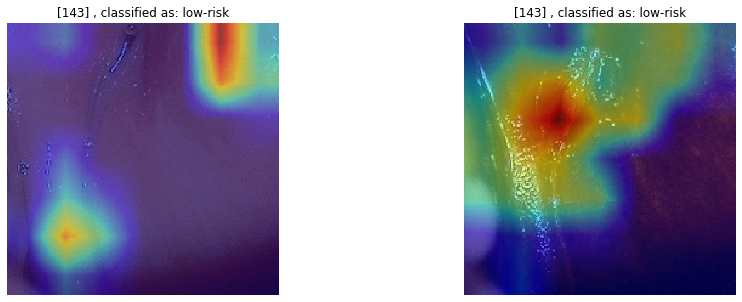

Patient ID : 15 | Voted classification: low-risk | Ground Truth: low-risk


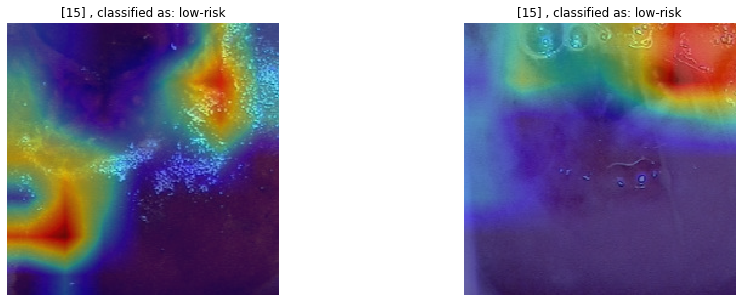

Patient ID : 43 | Voted classification: low-risk | Ground Truth: low-risk


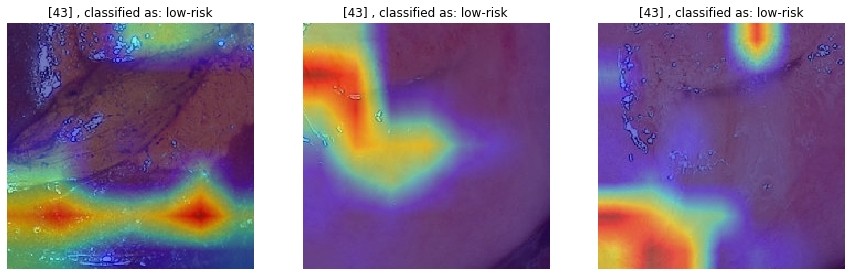

Patient ID : 236 | Voted classification: high-risk | Ground Truth: low-risk


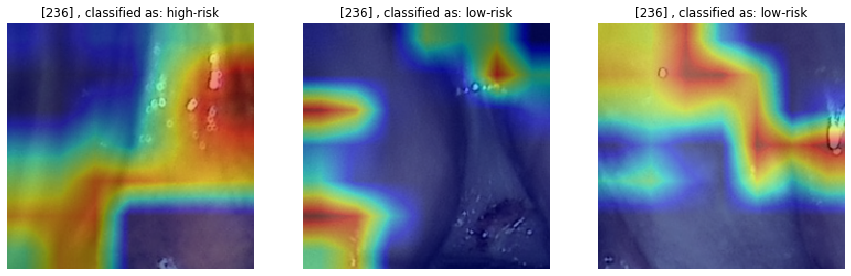

Patient ID : 11 | Voted classification: low-risk | Ground Truth: low-risk


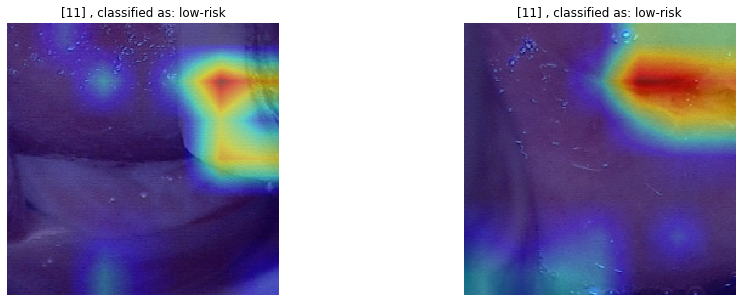

Patient ID : 30 | Voted classification: low-risk | Ground Truth: low-risk


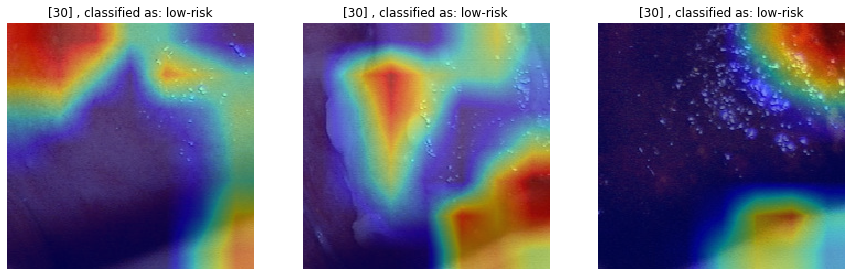

Patient ID : 100 | Voted classification: low-risk | Ground Truth: low-risk


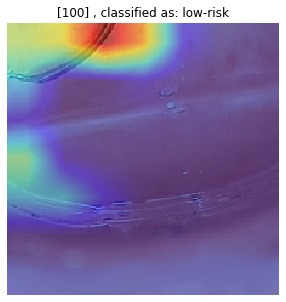

In [40]:
evaluate_all_patients('modelA',test, device,data='test', gradCam=True, only_high_risks=False)

Patient ID : 171 | Voted classification: high-risk | Ground Truth: high-risk


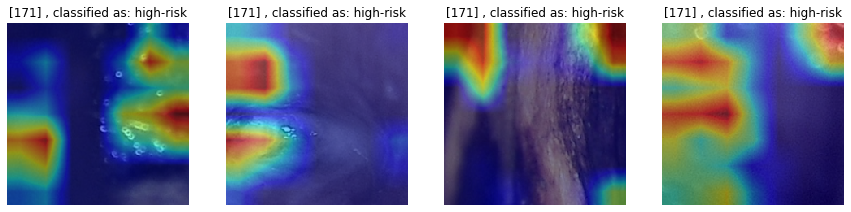

Patient ID : 212 | Voted classification: high-risk | Ground Truth: high-risk


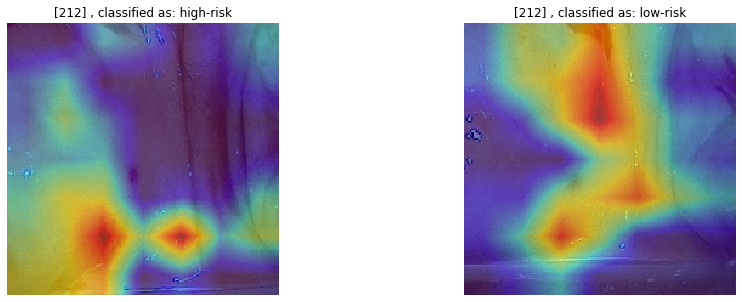

Patient ID : 237 | Voted classification: high-risk | Ground Truth: high-risk


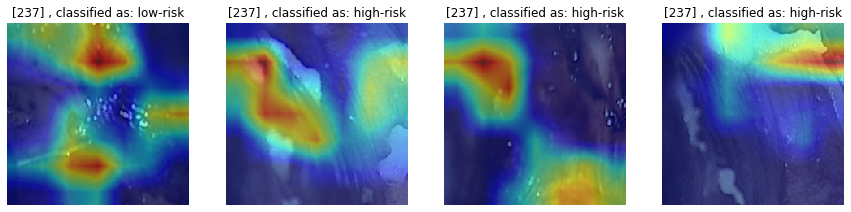

In [41]:
evaluate_all_patients('modelB',test2, device,data='test', gradCam=True, only_high_risks=True)

Patient ID : 171 | Voted classification: high-risk | Ground Truth: high-risk


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/opt/anaconda3/lib/python3.7/site-packages/numpy/ma/core.py:711: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


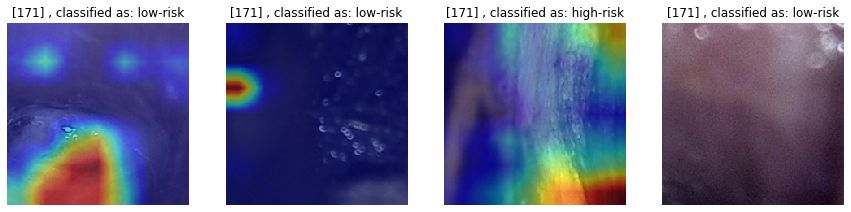

Patient ID : 212 | Voted classification: low-risk | Ground Truth: high-risk


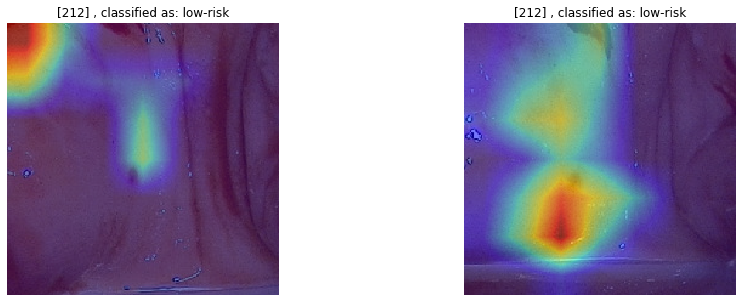

Patient ID : 237 | Voted classification: high-risk | Ground Truth: high-risk


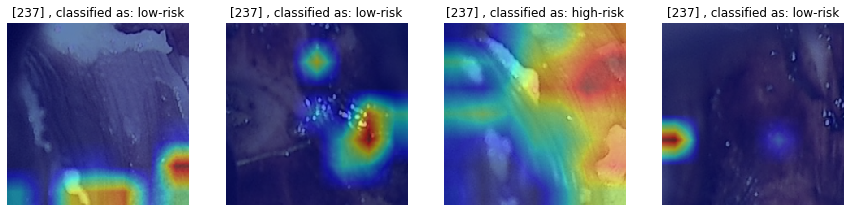

In [42]:
evaluate_all_patients('modelC',test, device,data='test', gradCam=True, only_high_risks=True)